<a href="https://colab.research.google.com/github/programmer-aarya7/delta-demo/blob/main/Fraud_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
## Importing Required Libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Machine Learning Libaries
from sklearn import svm,metrics,tree,preprocessing,linear_model
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import tensorflow as tf
import keras
from sklearn.model_selection import train_test_split,cross_val_score, cross_val_predict
from sklearn import svm,metrics,tree,preprocessing,linear_model
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import statsmodels.api as sm
from sklearn.metrics import accuracy_score,mean_squared_error,recall_score,confusion_matrix,f1_score,roc_curve, auc,roc_auc_score,precision_score
from keras import Sequential
from keras.layers import Dense, Activation, Dropout, LSTM, GRU
from keras.callbacks import CSVLogger
from sklearn.neural_network import MLPClassifier
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

In [2]:
!pip install statsmodels

In [3]:
import numpy as np
cm = np.array([[35169, 85],
               [123, 727]])

In [4]:
fpr=cm[0,1]/(cm[0,1]+cm[0,0])
tpr=cm[1,1]/(cm[1,1]+cm[1,0])


In [5]:
!pip install visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 997.4/997.4 kB 15.1 MB/s eta 0:00:00


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
df = pd.read_csv('/content/drive/MyDrive/DataCoSupplyChainDataset.csv', header=0, encoding='unicode_escape')

In [8]:
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,03/02/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,01/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,01/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,01/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,01/15/2018 11:24,Standard Class


In [9]:
df.shape

(180519, 53)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

In [11]:
df['order date']= pd.to_datetime(df['order date (DateOrders)'])
df['shipping date']= pd.to_datetime(df['shipping date (DateOrders)'])

In [ ]:
df['order year']=df['order date'].dt.year
df['order month']=df['order date'].dt.month
df['order day']=df['order date'].dt.day
df['order hour']=df['order date'].dt.hour
df['order minute']=df['order date'].dt.minute

df['shipping year']=df['shipping date'].dt.year
df['shipping month']=df['shipping date'].dt.month
df['shipping day']=df['shipping date'].dt.day
df['shipping hour']=df['shipping date'].dt.hour
df['shipping minute']=df['shipping date'].dt.minute

In [13]:
data=df.loc[:,['Type','Delivery Status','Sales per customer','Days for shipping (real)','Days for shipment (scheduled)','order year','order month','order day','order hour','order minute','Benefit per order','Category Name','Latitude','Longitude',
               'Customer Segment','Customer City','Customer Country','Customer State','Department Name','Market','Order City','Order Country','Order Item Discount','Order Item Product Price','Order Item Quantity','Order Item Total',
               'Order State','Order Region','Product Name','shipping year','shipping month','shipping day','shipping hour','shipping minute','Shipping Mode','Late_delivery_risk','Order Status','Sales','Product Price','Order Profit Per Order','Order Item Discount Rate','Order Item Profit Ratio']]
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Delivery Status                180519 non-null  object 
 2   Sales per customer             180519 non-null  float64
 3   Days for shipping (real)       180519 non-null  int64  
 4   Days for shipment (scheduled)  180519 non-null  int64  
 5   order year                     180519 non-null  int32  
 6   order month                    180519 non-null  int32  
 7   order day                      180519 non-null  int32  
 8   order hour                     180519 non-null  int32  
 9   order minute                   180519 non-null  int32  
 10  Benefit per order              180519 non-null  float64
 11  Category Name                  180519 non-null  object 
 12  Latitude                      

In [14]:
for i in data.columns:
    if data[i].dtype=='object':
        print(i,len(data[i].unique()))

Type 4
Delivery Status 4
Category Name 50
Customer Segment 3
Customer City 563
Customer Country 2
Customer State 46
Department Name 11
Market 5
Order City 3597
Order Country 164
Order State 1089
Order Region 23
Product Name 118
Shipping Mode 4
Order Status 9


In [15]:
data['Order Status'].value_counts()

,count
Order Status,
COMPLETE,59491
PENDING_PAYMENT,39832
PROCESSING,21902
PENDING,20227
CLOSED,19616
ON_HOLD,9804
SUSPECTED_FRAUD,4062
CANCELED,3692
PAYMENT_REVIEW,1893


In [16]:
data['Order Status']= [0 if i!='SUSPECTED_FRAUD' else 1 for i in data['Order Status']]
data['Order Status'].unique()

array([0, 1])

In [17]:
data['Order Status'].value_counts()

,count
Order Status,
0,176457
1,4062


In [18]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
enc=LabelEncoder()
for i in data.columns:
    if data[i].dtype=='object':
        data[i]=enc.fit_transform(data[i])
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  int64  
 1   Delivery Status                180519 non-null  int64  
 2   Sales per customer             180519 non-null  float64
 3   Days for shipping (real)       180519 non-null  int64  
 4   Days for shipment (scheduled)  180519 non-null  int64  
 5   order year                     180519 non-null  int32  
 6   order month                    180519 non-null  int32  
 7   order day                      180519 non-null  int32  
 8   order hour                     180519 non-null  int32  
 9   order minute                   180519 non-null  int32  
 10  Benefit per order              180519 non-null  float64
 11  Category Name                  180519 non-null  int64  
 12  Latitude                      

In [19]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(40,25),dpi=700)
cor = data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.coolwarm)

plt.figure()
mng = plt.get_current_fig_manager()
mng.full_screen_toggle()
plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
y=data['Order Status']
x=data.drop(['Order Status'],axis=1)

In [ ]:
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.2,random_state=42)

In [ ]:
y_train.value_counts()

In [ ]:
y_test.value_counts()

In [ ]:
scaler = StandardScaler().fit(x_train)
trainX = scaler.transform(x_train)
# summarize transformed data
np.set_printoptions(precision=3)
#print(trainX[0:5,:])

scaler = StandardScaler().fit(x_test)
testX = scaler.transform(x_test)
# summarize transformed data
np.set_printoptions(precision=3)
#print(testT[0:5,:])


y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
# reshape input to be [samples, time steps, features]
X_train = np.reshape(trainX, (trainX.shape[0], trainX.shape[1],1))
X_test = np.reshape(testX, (testX.shape[0], testX.shape[1],1))

In [ ]:
X_train.shape

In [ ]:
import numpy as np
cm = np.array([[35169, 85],
               [123, 727]])

In [ ]:
cm

In [ ]:
# Assuming y_true and y_pred are your true and predicted labels


# Calculate recall for each class
recall_class_0 = cm[0, 0] / (cm[0, 0] + cm[0, 1])  # Negative class
recall_class_1 = cm[1, 1] / (cm[1, 1] + cm[1, 0])  # Positive class

print("Recall for Class 0:", recall_class_0)
print("Recall for Class 1:", recall_class_1)

In [ ]:
import scipy.stats as stats

# Sample data: Replace with your actual model performance scores: overall accuracy and detection rate
model_scores = {
    "model1": [0.9942,0.89],
    "model2": [0.9947,0.81],
    "model3": [0.9921,0.82],
    "model4": [0.9811,0.30],
    "model5": [0.9802,0.20],
    "model6": [0.9881,0.70],
    "model7": [0.1280,0.11],
    "model8": [0.1205,0.10],
    "model9": [0.9764,0.00],
    "model10": [0.9775, 0.19],
    }

# Convert scores to a list of lists
data = [list(model_scores[model]) for model in model_scores]

# Perform the Friedman test
friedman_stat, p_value = stats.friedmanchisquare(*data)

print("Friedman test statistic:", friedman_stat)
print("p-value:", p_value)

# Interpretation:
if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant difference between the models.")
else:
    print("Fail to reject the null hypothesis: No significant difference found.")

In [ ]:
stats.friedmanchisquare(*data)

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

# Model Creation
model = Sequential()
model.add(GRU(32, activation='sigmoid', input_shape=(41, 1)))
model.add(Dense(1, activation='sigmoid'))  # Add this Dense layer

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

checkpointer = ModelCheckpoint(filepath="model_supply_rnn.keras",
                               verbose=1,
                               save_best_only=True,
                               monitor='val_accuracy',
                               mode='max')

csv_logger = CSVLogger('training_set_iranalysis.csv', separator=',', append=False)

h = model.fit(X_train, y_train, epochs=1, batch_size=32,
              validation_data=(X_test, y_test),
              callbacks=[checkpointer, csv_logger])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru (GRU)                            │ (None, 32)                  │           3,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,393 (13.25 KB)

 Trainable params: 3,393 (13.25 KB)

 Non-trainable params: 0 (0.00 B)

4513/4513 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9661 - loss: 0.1340
Epoch 1: val_accuracy improved from -inf to 0.97646, saving model to model_supply_rnn.keras
4513/4513 ━━━━━━━━━━━━━━━━━━━━ 99s 21ms/step - accuracy: 0.9661 - loss: 0.1340 - val_accuracy: 0.9765 - val_loss: 0.1105


In [ ]:
trainX

In [ ]:
x_train

In [ ]:
from sklearn.decomposition import PCA

# Create an LDA instance and fit it to the training data
pca = PCA(n_components=22)
pca.fit(trainX, y_train)

In [ ]:
pca.explained_variance_ratio_

In [ ]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

In [ ]:
# Plot the cumulative explained variance
plt.figure(figsize=(10, 8))
plt.plot(range(1, 23), cumulative_variance, marker='o', linestyle='--', color='g')
#plt.title('Cumulative Explained Variance for PCA Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
# Apply PCA to reduce the dimensionality of the data
X_train_reduced = pca.transform(trainX)
X_test_reduced = pca.transform(testX)

In [ ]:
X_train_reduced.shape

In [ ]:
y_train.shape

In [ ]:
from keras.regularizers import l1, l2

In [ ]:
model = Sequential()
model.add(Dense(512,activation='relu',input_dim=41))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

model = Sequential()
model.add(Input(shape=(41,)))  # Use Input layer instead of input_dim
model.add(Dense(512, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

In [45]:
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

checkpointer = ModelCheckpoint(filepath="model_supply_pca.keras",  # Corrected to .keras
                               verbose=1,
                               save_best_only=True,
                               monitor='val_accuracy',
                               mode='max')

csv_logger = CSVLogger('training_set_iranalysis.csv', separator=',', append=False)

h = model.fit(trainX, y_train, epochs=10, batch_size=32,
              validation_data=(testX, y_test),
              callbacks=[checkpointer, csv_logger])

Epoch 1/10
4510/4513 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9772 - loss: 0.0468
Epoch 1: val_accuracy improved from -inf to 0.97823, saving model to model_supply_pca.keras
4513/4513 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - accuracy: 0.9772 - loss: 0.0468 - val_accuracy: 0.9782 - val_loss: 0.0323
Epoch 2/10
4513/4513 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9795 - loss: 0.0309
Epoch 2: val_accuracy improved from 0.97823 to 0.97948, saving model to model_supply_pca.keras
4513/4513 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - accuracy: 0.9795 - loss: 0.0309 - val_accuracy: 0.9795 - val_loss: 0.0296
Epoch 3/10
4504/4513 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9801 - loss: 0.0303
Epoch 3: val_accuracy improved from 0.97948 to 0.98069, saving model to model_supply_pca.keras
4513/4513 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - accuracy: 0.9801 - loss: 0.0303 - val_accuracy: 0.9807 - val_loss: 0.0311
Epoch 4/10
4510/4513 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9814 - loss: 0.0302
Epoch 

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import regularizers

checkpointer = ModelCheckpoint(filepath="model_supply.keras",
                               verbose=1,
                               save_best_only=True,
                               monitor='val_accuracy',
                               mode='max')

csv_logger = CSVLogger('training_set_iranalysis.csv', separator=',', append=False)

early_stopping = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

# Reduced epochs and batch size
model.fit(trainX, y_train, epochs=20, batch_size=16, validation_data=(testX, y_test), callbacks=[checkpointer, csv_logger, early_stopping, reduce_lr])

# Load the saved model (if needed)
loaded_model = tf.keras.models.load_model('model_supply.keras')

In [ ]:
model.load_weights('model_supply.hdf5')

In [48]:
loss, accuracy = model.evaluate(testX, y_test)
print("\nLoss: %.2f, Accuracy: %.2f%%" % (loss, accuracy*100))

1129/1129 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.9914 - loss: 0.0366

Loss: 0.04, Accuracy: 99.07%


In [49]:
y_pred=model.predict(testX)
#y_pred_prob=model.predict_proba(testX)
classes_x=np.argmax(y_pred,axis=1)

1129/1129 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step


In [50]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()

In [52]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score,mean_squared_error,recall_score,confusion_matrix,f1_score,roc_curve, auc

In [53]:
#check each classifier accuracy here
clf=rf
clf.fit(trainX,y_train)
y_pred_ml=clf.predict(testX)
acc=accuracy_score(y_test,y_pred_ml)
prc=precision_score(y_test,y_pred_ml, average="weighted")
rc=recall_score(y_test,y_pred_ml, average="weighted")
f1=f1_score(y_test,y_pred_ml, average="weighted")
print(acc,prc,rc,f1)

print(classification_report(y_test,y_pred_ml.round()))

0.9948482162641259 0.9947034236273476 0.9948482162641259 0.9946774093958696
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     35254
           1       0.95      0.83      0.88       850

    accuracy                           0.99     36104
   macro avg       0.97      0.91      0.94     36104
weighted avg       0.99      0.99      0.99     36104



In [59]:
from sklearn.decomposition import PCA

# Step 1: Apply PCA
pca = PCA(n_components=10)  # Change number of components as needed
trainX_pca = pca.fit_transform(trainX)
testX_pca = pca.transform(testX)

# Step 2: Train classifier on PCA-transformed data
clf_pca = RandomForestClassifier()
clf_pca.fit(trainX_pca, y_train)

# Step 3: Predict probabilities
y_pred1 = clf_pca.predict_proba(testX_pca)[:, 1]  # Use probability for ROC curve


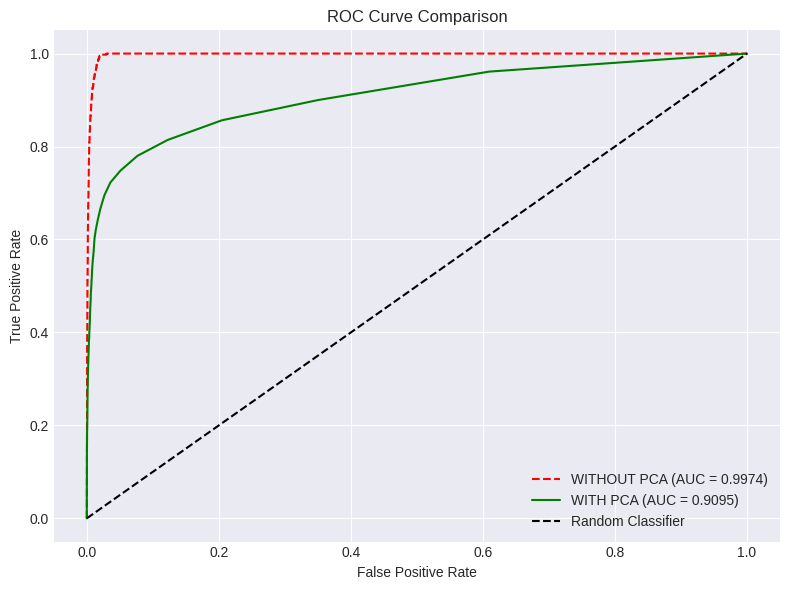

In [60]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Compute ROC curves and AUCs
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_pred1, pos_label=1)


# Random classifier (baseline)
random_probs = [0 for _ in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

# Calculate AUC scores
auc_without_pca = roc_auc_score(y_test, y_pred)
auc_with_pca = roc_auc_score(y_test, y_pred1)

# Use seaborn style and increase figure size
plt.style.use('seaborn-v0_8-darkgrid')  # updated seaborn style
plt.figure(figsize=(8, 6))

# Plot ROC curves
plt.plot(fpr, tpr, linestyle='--', color='red', label=f'WITHOUT PCA (AUC = {auc_without_pca:.4f})')
plt.plot(fpr1, tpr1, linestyle='-', color='green', label=f'WITH PCA (AUC = {auc_with_pca:.4f})')
plt.plot(p_fpr, p_tpr, linestyle='--', color='black', label='Random Classifier')

# Plot settings
plt.title('ROC Curve Comparison')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()

# Save and show the plot
plt.savefig('ROC_comparison.png', dpi=300)
plt.show()


In [62]:
cm = metrics.confusion_matrix(y_test, y_pred.round())
class_arr=['Legitimate','Fraud']
print (cm)

[[35158    96]
 [  241   609]]


In [63]:
r=recall_score(y_test, y_pred.round())
r

0.7164705882352941

In [64]:
prc=precision_score(y_test,y_pred.round(), average="weighted")
rc=recall_score(y_test,y_pred.round(), average="weighted")
f1=f1_score(y_test,y_pred.round(), average="weighted")
print(accuracy,prc,rc,f1)

0.990665853023529 0.990146313259691 0.9906658541989807 0.9902402390636306


In [65]:
roc_auc=roc_auc_score(y_test, y_pred)

In [66]:
roc_auc

np.float64(0.9973922692126718)

In [67]:
from sklearn.metrics import classification_report
print(classification_report(y_test,classes_x.round()))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     35254
           1       0.00      0.00      0.00       850

    accuracy                           0.98     36104
   macro avg       0.49      0.50      0.49     36104
weighted avg       0.95      0.98      0.96     36104



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [68]:
model1 = Sequential()

model1.add(Dense(512,activation='relu',input_dim = 22))
model1.add(Dense(128, activation='relu'))
model1.add(Dense(64, activation='relu'))
model1.add(Dense(1, activation='sigmoid'))
model1.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model1.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_9 (Dense)                      │ (None, 512)                 │          11,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 85,761 (335.00 KB)

 Trainable params: 85,761 (335.00 KB)

 Non-trainable params: 0 (0.00 B)

In [69]:
import visualkeras

visualkeras.layered_view(model1).show() # display using your system viewer
visualkeras.layered_view(model1, to_file='output.png') # write to disk
visualkeras.layered_view(model1, to_file='output.png').show() # write and show

visualkeras.layered_view(model1)

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")
/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")
/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


In [71]:
from keras.callbacks import ModelCheckpoint, CSVLogger

# Corrected ModelCheckpoint with .keras extension
checkpointer = ModelCheckpoint(
    filepath="model_supply_with_pca.keras",  # Use .keras instead of .hdf5
    verbose=1,
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

# CSV Logger remains the same
csv_logger = CSVLogger('training_set_iranalysis.csv', separator=',', append=False)

# Training with safe batch size
model1.fit(
    X_train_reduced,
    y_train,
    epochs=20,
    batch_size=64,  # Optimal for Colab
    validation_data=(X_test_reduced, y_test),
    callbacks=[checkpointer, csv_logger]
)


Epoch 1/20
2251/2257 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9780 - loss: 0.0536
Epoch 1: val_accuracy improved from -inf to 0.98094, saving model to model_supply_with_pca.keras
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.9780 - loss: 0.0535 - val_accuracy: 0.9809 - val_loss: 0.0298
Epoch 2/20
2252/2257 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9806 - loss: 0.0298
Epoch 2: val_accuracy did not improve from 0.98094
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9806 - loss: 0.0298 - val_accuracy: 0.9800 - val_loss: 0.0301
Epoch 3/20
2255/2257 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9817 - loss: 0.0293
Epoch 3: val_accuracy improved from 0.98094 to 0.98189, saving model to model_supply_with_pca.keras
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 21s 5ms/step - accuracy: 0.9817 - loss: 0.0293 - val_accuracy: 0.9819 - val_loss: 0.0293
Epoch 4/20
2252/2257 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9830 - loss: 0.0281
Epoch 4: val_accuracy improved from 0.98

In [73]:
model1.load_weights('model_supply_with_pca.keras')  # Use .keras instead of .hdf5

In [74]:
loss, accuracy = model1.evaluate(X_test_reduced, y_test)
print("\nLoss: %.2f, Accuracy: %.2f%%" % (loss, accuracy*100))

1129/1129 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9911 - loss: 0.0344

Loss: 0.03, Accuracy: 99.12%


In [75]:
y_pred1=model1.predict(X_test_reduced)
cm = metrics.confusion_matrix(y_test, y_pred1.round())
class_arr=['Legitimate','Fraud']
print (cm)

1129/1129 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
[[35103   151]
 [  166   684]]


In [76]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred1.round()))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     35254
           1       0.82      0.80      0.81       850

    accuracy                           0.99     36104
   macro avg       0.91      0.90      0.90     36104
weighted avg       0.99      0.99      0.99     36104



In [77]:
prc1=precision_score(y_test,y_pred1.round(), average="weighted")
rc1=recall_score(y_test,y_pred1.round(), average="weighted")
f11=f1_score(y_test,y_pred1.round(), average="weighted")
print(accuracy,prc1,rc1,f11)

0.9912198185920715 0.9911466326554824 0.9912198094393972 0.9911816622307057
